# Overview

In [1]:
# based off this notebook https://www.tensorflow.org/tutorials/generative/cyclegan

this notebook will explore the use of cycle consistent GANs in the application of sketch to face translation. The code is based on the starter code providd by the authors of the original paper. The code has been modified to support eager execution and to test various hyperparameters; most of the utility functions have not been modified. The diagrams illustrating the learning process of this network are not original either.  The first generator and discriminator architectures we will use are the same U-net and patchGAN architectures that were used for the conditional GAN model. 

We have original code for the input pipeline with our dataset


We explore the use of varying the relationship between the generator and discriminator learning rates. In our fit using conditional GANs we set the two learning rates to be equal. We will explore how varying the rates at which the two networks comprising the GAN relative to one another will affect learning. 

## This notebook explores the use of a GAN that is trained on unpaired training examples. 

The model builds upon the conditional GAN architecture we explored previously
The difference in the Cycle Consistent GAN is that the model attempts to learn a mapping from the input domain to the
target domain as well as a mapping from the target to input. 

## This architecture attempts to learn translations in both directions

In [1]:
! unzip sketch_data.zip

Archive:  sketch_data.zip
   creating: sketch_data/
  inflating: sketch_data/.DS_Store   
   creating: __MACOSX/
   creating: __MACOSX/sketch_data/
  inflating: __MACOSX/sketch_data/._.DS_Store  
   creating: sketch_data/test/
  inflating: sketch_data/test/004001.jpg  
  inflating: sketch_data/test/004002.jpg  
  inflating: sketch_data/test/004003.jpg  
  inflating: sketch_data/test/004004.jpg  
  inflating: sketch_data/test/004005.jpg  
  inflating: sketch_data/test/004006.jpg  
  inflating: sketch_data/test/004007.jpg  
  inflating: sketch_data/test/004008.jpg  
  inflating: sketch_data/test/004009.jpg  
  inflating: sketch_data/test/004010.jpg  
  inflating: sketch_data/test/004011.jpg  
  inflating: sketch_data/test/004012.jpg  
  inflating: sketch_data/test/004013.jpg  
  inflating: sketch_data/test/004014.jpg  
  inflating: sketch_data/test/004015.jpg  
  inflating: sketch_data/test/004016.jpg  
  inflating: sketch_data/test/004017.jpg  
  inflating: sketch_data/test/004018.jpg  

In [2]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

We will use the same utility functions to load and process our paired dataset as we did in the previous notebook. Each training step will take in an input and target pair, however the two images will be processed separately and not related to one another so our training can be considered unpaired. 

In [3]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [4]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [5]:
def load(image_file):
  '''
  load in a jpeg file containing both the input image and the target imaage
  '''
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, w:, :]
  input_image = image[:, :w, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [6]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

# a function to randomly transform images, this was used in the original pix2pix paper 
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image


In [7]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [8]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)


# Create Input Pipeline

In [9]:
train_dataset = tf.data.Dataset.list_files('./sketch_data/train/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [10]:
test_dataset = tf.data.Dataset.list_files('./sketch_data/test/*.jpg')
test_dataset = test_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)


* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](images/cyclegan_model.png)

In [11]:
# Define Generator

In [12]:
OUTPUT_CHANNELS = 3

In [13]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [14]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [15]:
def Generator(stack_depth=3):
  '''
  function to define our generator network
  the parameter stack_depth is used to explore the performance ov various layer depths, max value is 3
  '''
  inputs = tf.keras.layers.Input(shape=[256,256,3])
  
  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    #downsample(512, 4), # (bs, 4, 4, 512)
    #downsample(512, 4), # (bs, 2, 2, 512)
    #downsample(512, 4), # (bs, 1, 1, 512)
  ]

  # add set number of layers to encoder stack
  for i in range(stack_depth):
    down_stack.append(downsample(512,4))

  # add set number of layers to decoder stack
  up_stack = []
  for i in range(stack_depth):
    up_stack.append(upsample(512,4,apply_dropout=True))

  up_stack += [
    #upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    #upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    #upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  output_channels = 3

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(output_channels, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [16]:
# the discriminator network is the same used in the conditional gan model 
# this network has been modified to take in a single image instead of two 

def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  x = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  #tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  #x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=x, outputs=last)

# Loss Functions

In [17]:
LAMBDA = 10

In [18]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [19]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [20]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [21]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

In [22]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [23]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Training

In [24]:
'''
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')
'''

'\ncheckpoint_path = "./checkpoints/train"\n\nckpt = tf.train.Checkpoint(generator_g=generator_g,\n                           generator_f=generator_f,\n                           discriminator_x=discriminator_x,\n                           discriminator_y=discriminator_y,\n                           generator_g_optimizer=generator_g_optimizer,\n                           generator_f_optimizer=generator_f_optimizer,\n                           discriminator_x_optimizer=discriminator_x_optimizer,\n                           discriminator_y_optimizer=discriminator_y_optimizer)\n\nckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)\n\n# if a checkpoint exists, restore the latest checkpoint.\nif ckpt_manager.latest_checkpoint:\n  ckpt.restore(ckpt_manager.latest_checkpoint)\n  print (\'Latest checkpoint restored!!\')\n'

In [25]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [26]:
def save_images(model, test_input, tar, path):
    prediction = model(test_input, training=True)

    tf.keras.preprocessing.image.save_img(path+"input.jpg", test_input[0])
    tf.keras.preprocessing.image.save_img(path+"target.jpg", tar[0])
    tf.keras.preprocessing.image.save_img(path+"generated.jpg", prediction[0])

In [27]:
def train_step(model, real_x, real_y):
  # unpack model
  generator_g = model["generator_g"]
  generator_f = model["generator_f"]
  discriminator_x = model["discriminator_x"]
  discriminator_y = model["discriminator_y"]
  generator_g_optimizer = model["generator_g_optimizer"]
  generator_f_optimizer = model["generator_f_optimizer"]
  discriminator_x_optimizer = model["discriminator_x_optimizer"]
  discriminator_y_optimizer = model['discriminator_y_optimizer']

  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

In [28]:
def fit(model, train_ds, epochs):
  for epoch in range(epochs):
    display.clear_output(wait=True)
    print("Epoch",epoch)

    for example_input, example_target in train_ds.take(1):
      generate_images(model['generator_g'], example_input, example_target)
      generate_images(model['generator_f'], example_target, example_input)

    start = time.time()

    for n, (image_x, image_y) in train_ds.enumerate():
      train_step(model, image_x, image_y)
      if n % 10 == 0:
        print ('.', end='')

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

# Test outputs for different learning rates on a subset of the training data

In [29]:
! mkdir ./results

In [30]:
train_subset = train_dataset.take(100)

In [31]:
validate = test_dataset.take(5)

Epoch 19


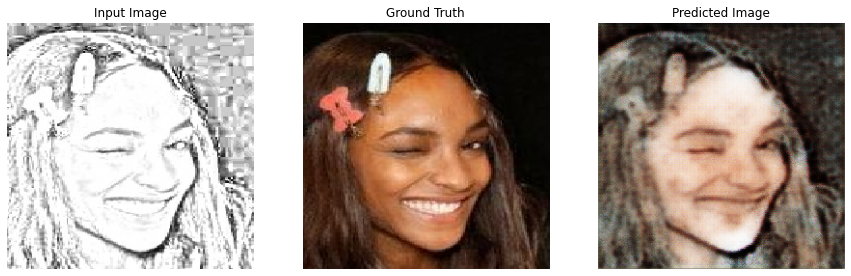

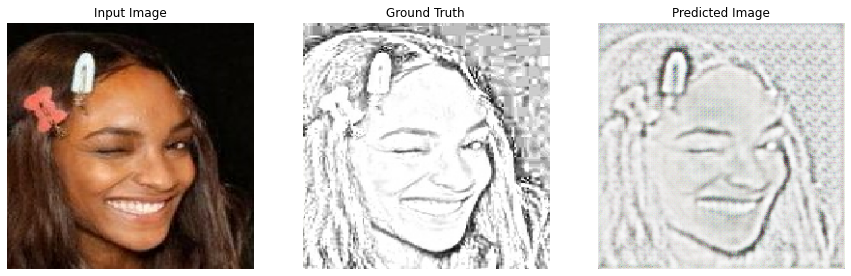

..........Time taken for epoch 20 is 58.26716709136963 sec



In [32]:
alpha_models = {}
EPOCHS = 20

for alpha in [0.001,0.0001, 0.00001]:
  model = {}

  model['generator_g'] = Generator()
  model['generator_f']= Generator()
  model['discriminator_x'] = Discriminator()
  model['discriminator_y'] = Discriminator()

  model['generator_g_optimizer'] = tf.keras.optimizers.Adam(alpha, beta_1=0.5)
  model['generator_f_optimizer'] = tf.keras.optimizers.Adam(alpha, beta_1=0.5)
  model['discriminator_x_optimizer'] = tf.keras.optimizers.Adam(alpha, beta_1=0.5)
  model['discriminator_y_optimizer'] = tf.keras.optimizers.Adam(alpha, beta_1=0.5)

  fit(model, train_subset, EPOCHS)

  # save model to dictionary
  name = "alpha="+str(alpha)
  alpha_models[name] = model

  # save sample outputs
  filepath = './results/' + name + '_sample_'
  n = 1
  for i, (inp, tar) in validate.enumerate():
    save_images(model['generator_g'], inp, tar, filepath+str(n)+'_')
    n += 1

alpha=0.001


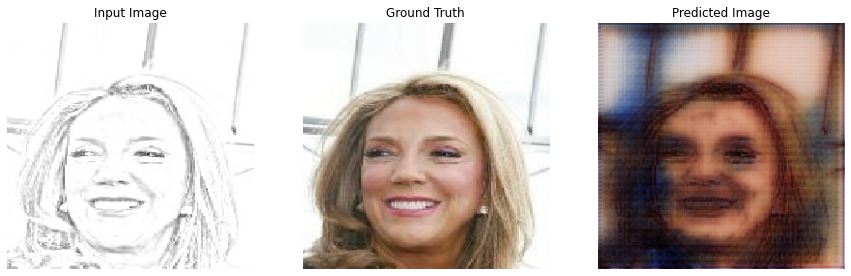

alpha=0.0001


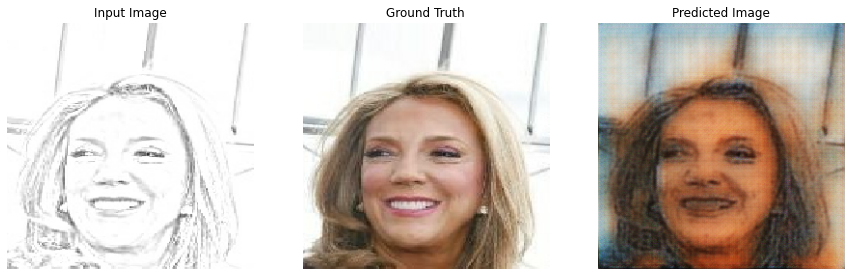

alpha=1e-05


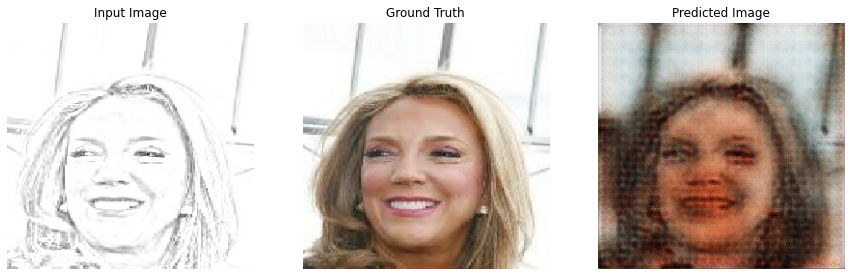

alpha=0.001


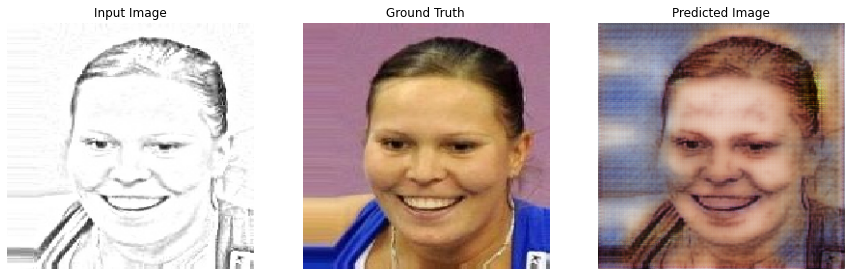

alpha=0.0001


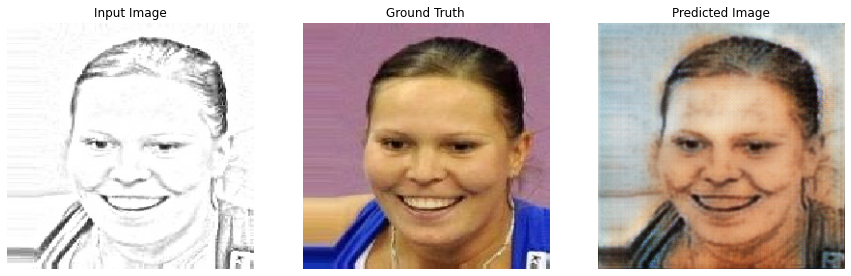

alpha=1e-05


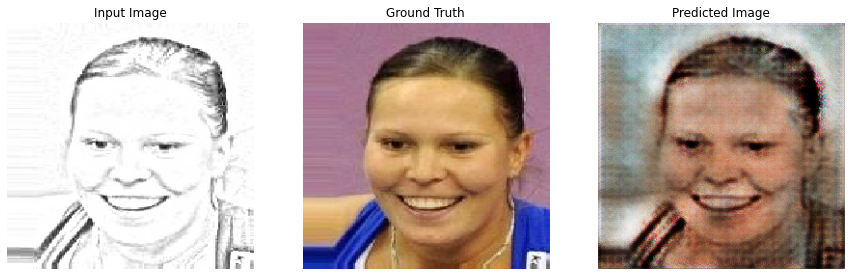

alpha=0.001


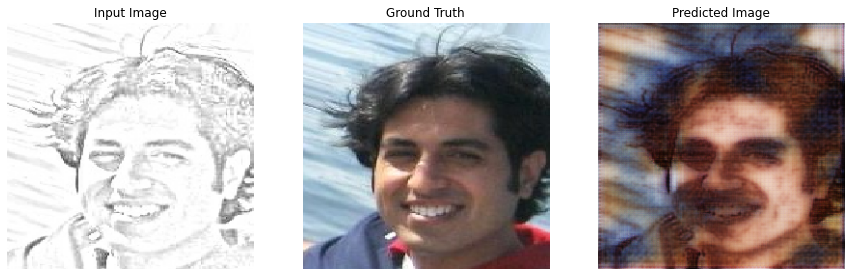

alpha=0.0001


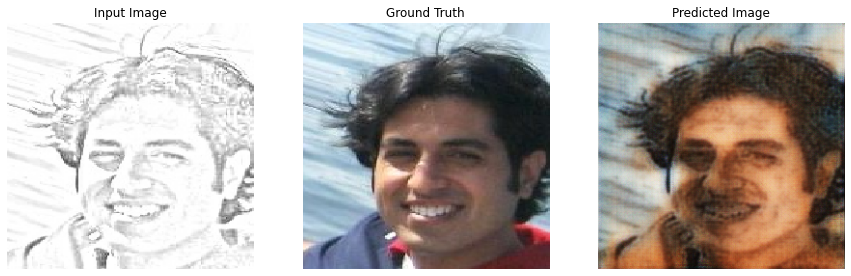

alpha=1e-05


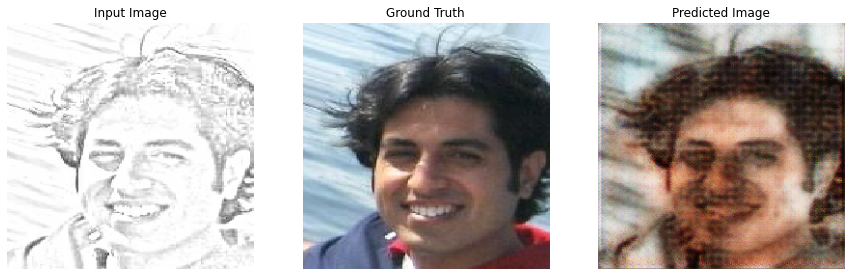

alpha=0.001


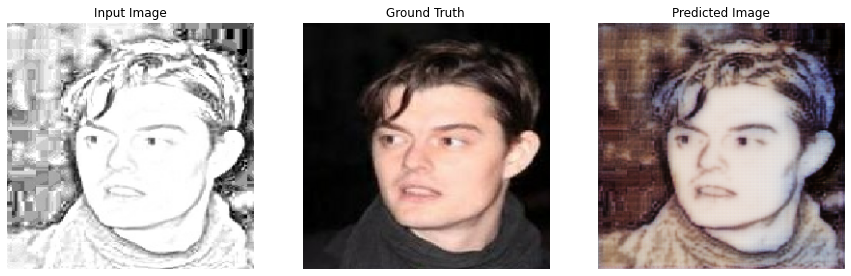

alpha=0.0001


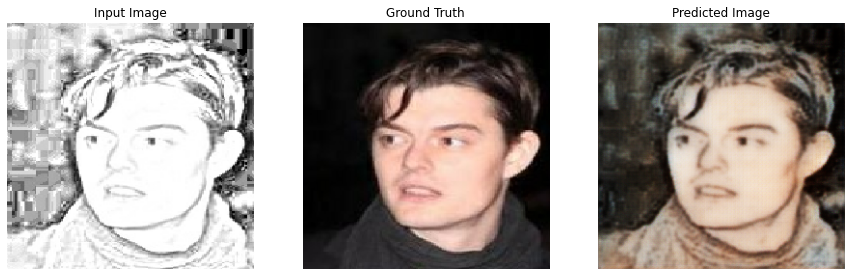

alpha=1e-05


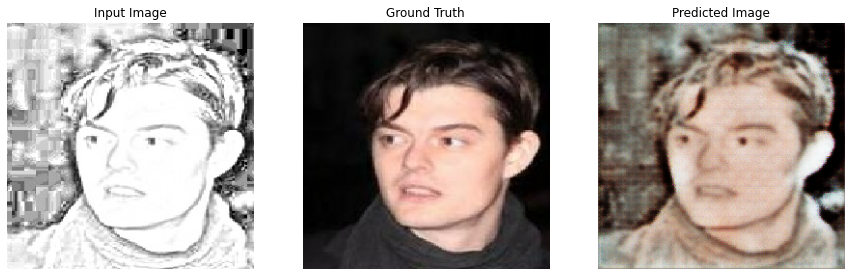

alpha=0.001


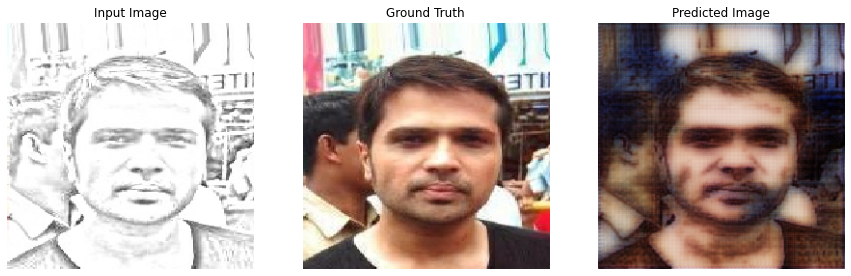

alpha=0.0001


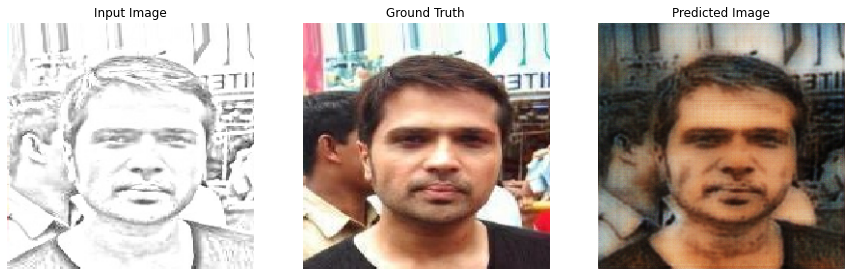

alpha=1e-05


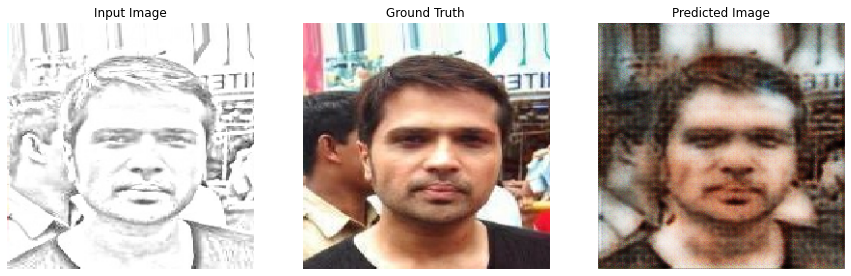

In [38]:
for i, (inp, tar) in validate.enumerate():
  for name, model in alpha_models.items():
    print(name)
    generate_images(model['generator_g'], inp, tar)

A learning rate of 0.0001 appears to perform the best at capturing structure and detail. The learning rate of 0.001 appears to capture the high level regions that should be shaded a particular color but does not have too much detail within those regions.

# We will now explore different learning rates for the generators in our models 

We will now compare the results of varying the learning rate of our generators in relation to the discriminator learning rate. We will investigate if having the generator learn faster or slower than the discriminator will affect results

Epoch 19


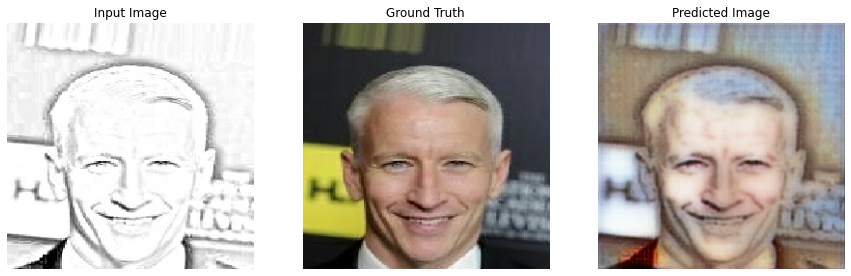

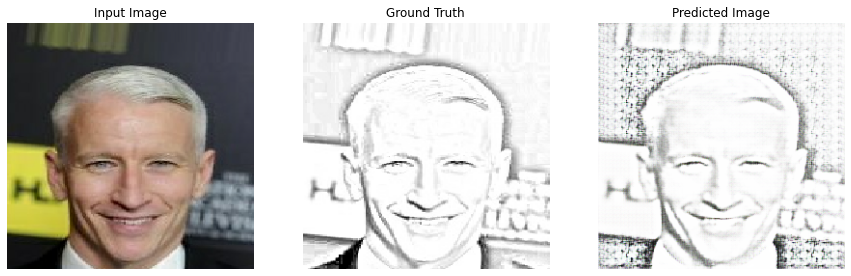

..........Time taken for epoch 20 is 58.152419090270996 sec



In [39]:
ratio_models = {}

EPOCHS = 20
base_alpha = 0.0001

for ratio in [0.5,1,2]:
  generator_alpha = ratio * base_alpha

  model = {}

  model['generator_g'] = Generator()
  model['generator_f']= Generator()
  model['discriminator_x'] = Discriminator()
  model['discriminator_y'] = Discriminator()

  model['generator_g_optimizer'] = tf.keras.optimizers.Adam(generator_alpha, beta_1=0.5)
  model['generator_f_optimizer'] = tf.keras.optimizers.Adam(generator_alpha, beta_1=0.5)
  model['discriminator_x_optimizer'] = tf.keras.optimizers.Adam(base_alpha, beta_1=0.5)
  model['discriminator_y_optimizer'] = tf.keras.optimizers.Adam(base_alpha, beta_1=0.5)

  fit(model, train_subset, EPOCHS)

  # save model to dictionary
  name = "ratio="+str(ratio)
  ratio_models[name] = model

  # save sample outputs
  filepath = './results/' name + '_sample_'
  for n, (inp, tar) in validate.enumerate():
    save_images(model["generator_g"], inp, tar, filepath+str(n))

ratio=0.5


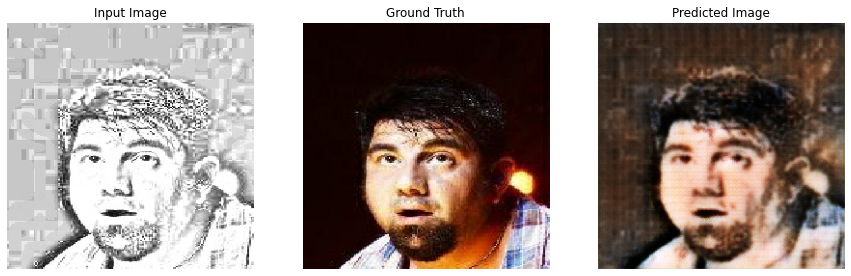

ratio=1


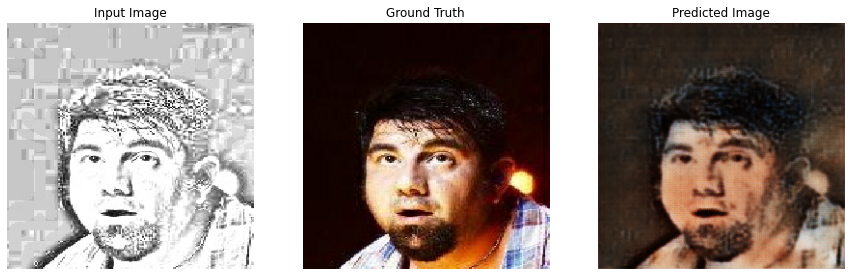

ratio=2


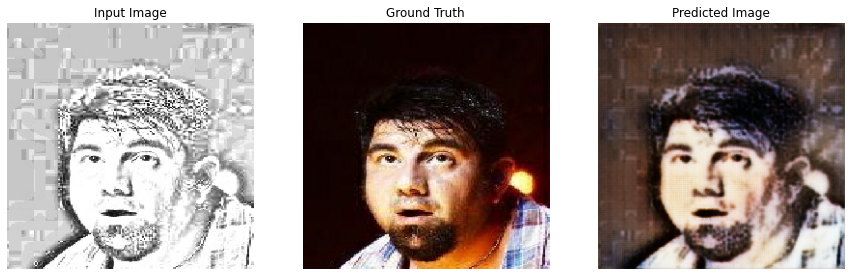

ratio=0.5


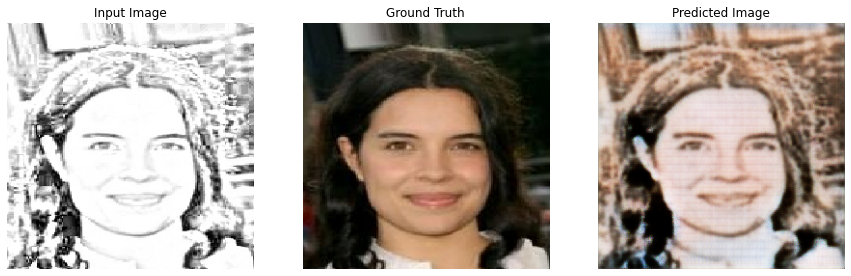

ratio=1


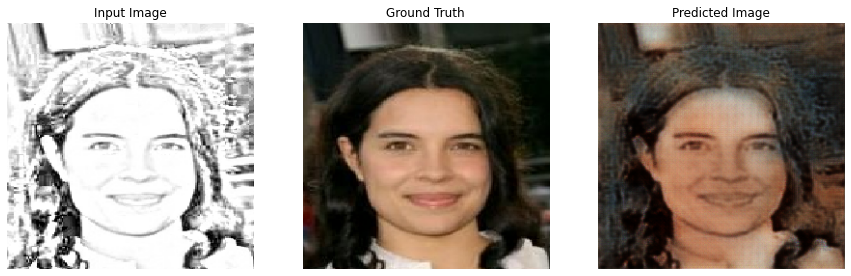

ratio=2


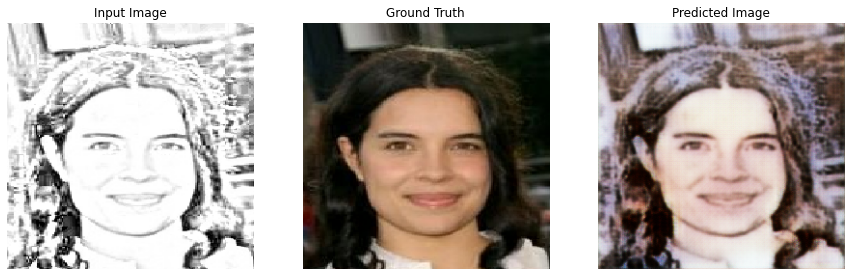

ratio=0.5


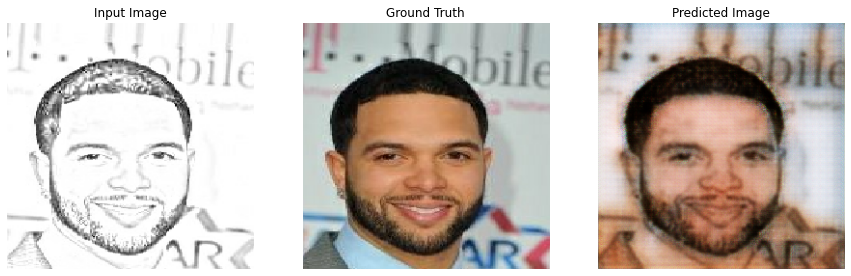

ratio=1


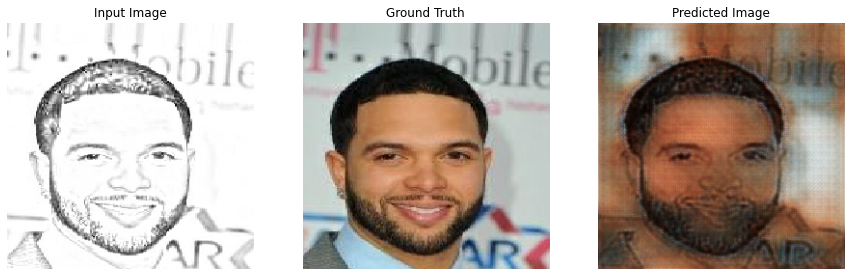

ratio=2


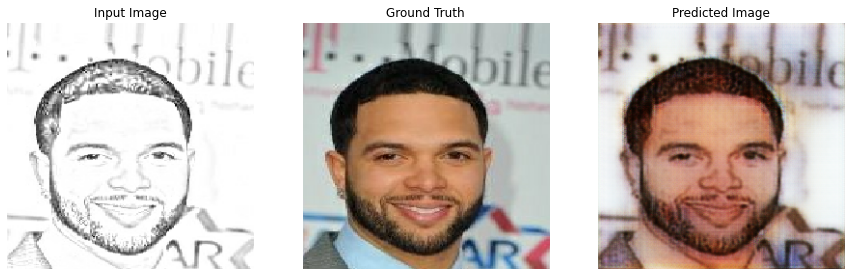

ratio=0.5


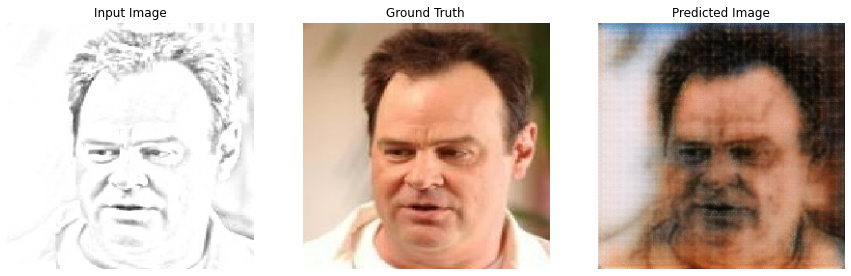

ratio=1


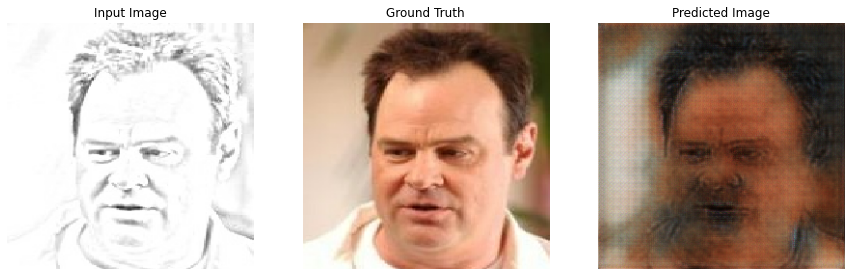

ratio=2


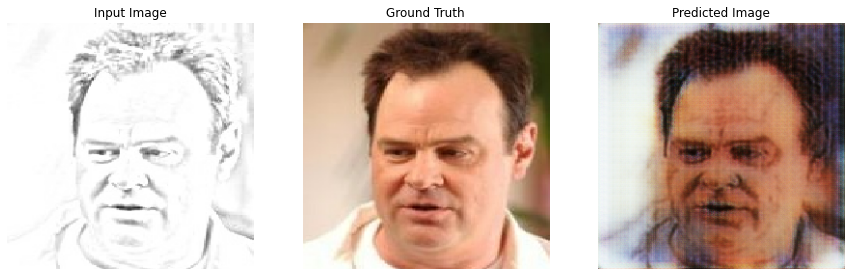

ratio=0.5


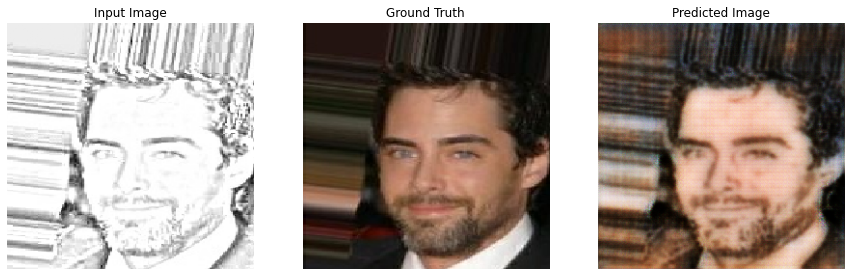

ratio=1


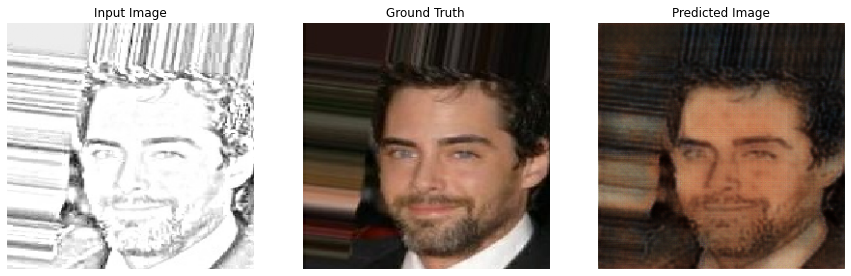

ratio=2


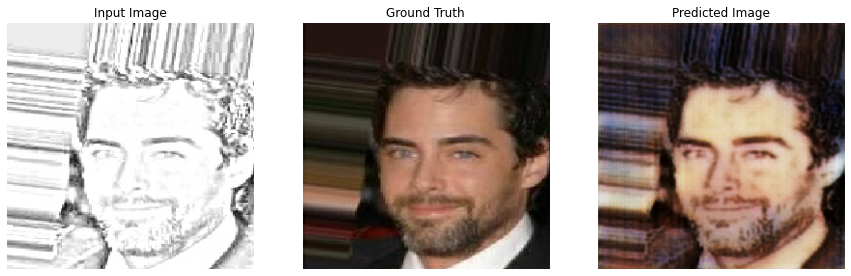

In [42]:
for i, (inp, tar) in validate.enumerate():
  for name, model in ratio_models.items():
    print(name)
    generate_images(model['generator_g'], inp, tar)

The generator with a learning rate of half the discriminator rate and the generator with a learning rate double the discriminator rate appear to have the best output. We will train a model with a generator rate twice the discriminator rate on the full dataset for 200 epochs, it seems the other choice may be promising as well.

# Train final model

In [43]:
# we will limit our dataset to 1000 images due to limitations on computing power

In [32]:
tf.keras.backend.clear_session()

In [33]:
final_model = {}

final_model['generator_g'] = Generator()
final_model['generator_f']= Generator()
final_model['discriminator_x'] = Discriminator()
final_model['discriminator_y'] = Discriminator()

final_model['generator_g_optimizer'] = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
final_model['generator_f_optimizer'] = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
final_model['discriminator_x_optimizer'] = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)
final_model['discriminator_y_optimizer'] = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

Epoch 100


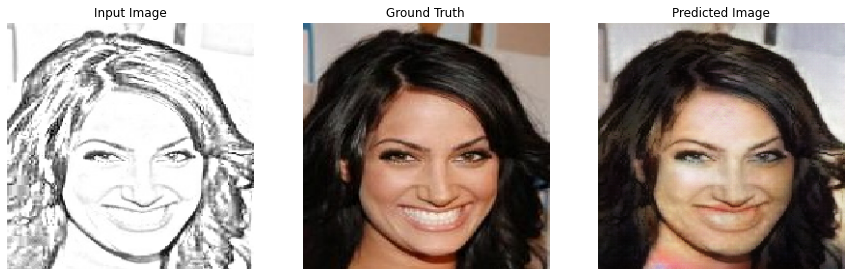

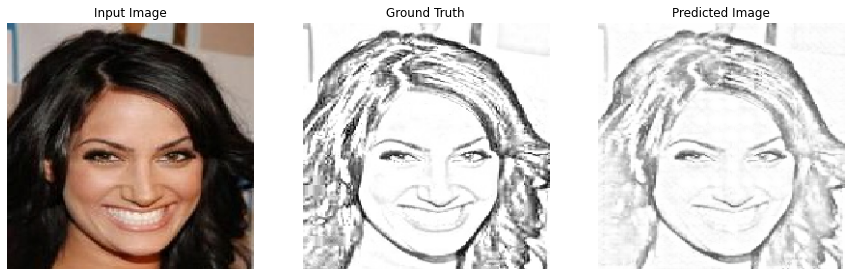

.....

KeyboardInterrupt: ignored

In [34]:
fit(final_model,train_dataset.take(1000),epochs=200)

# We will stop training after 100 epochs instead of 200 due to slow training time

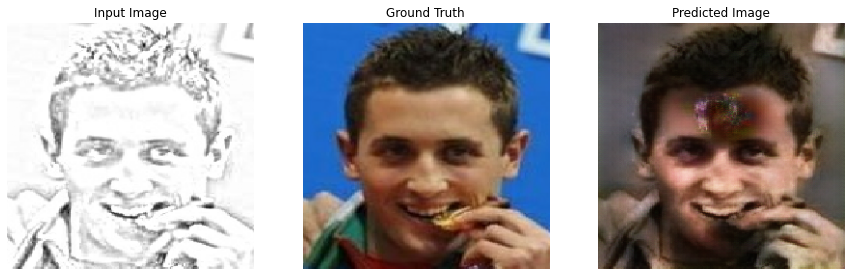

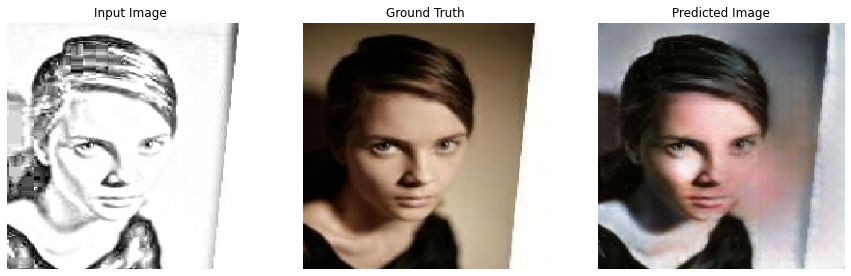

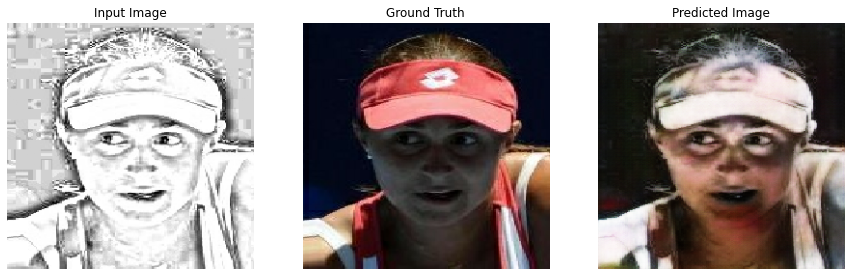

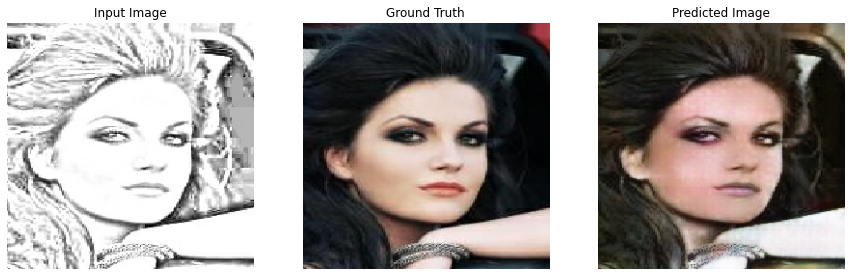

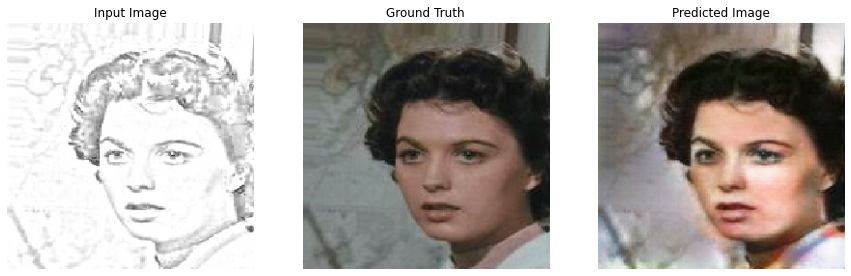

...

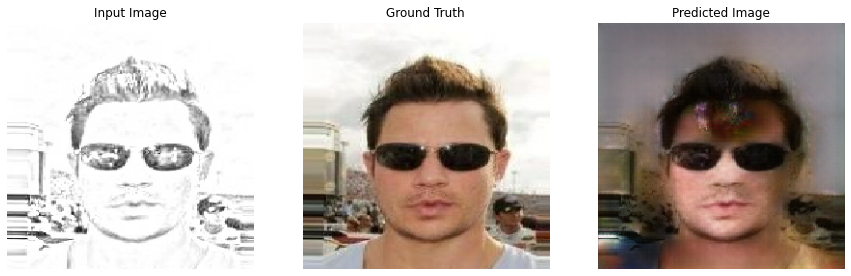

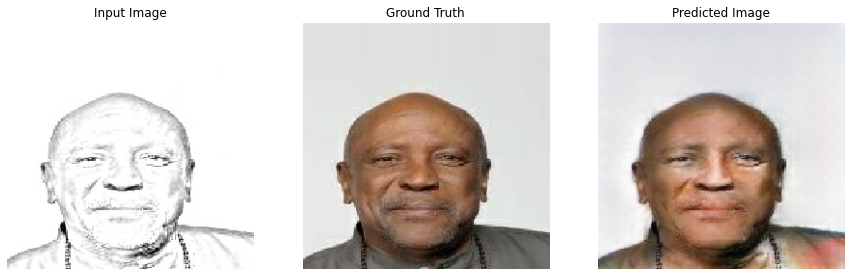

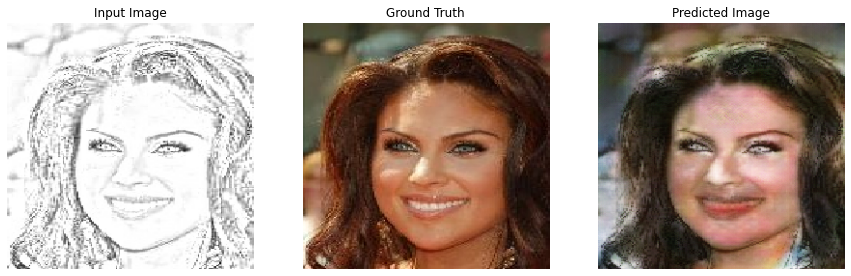

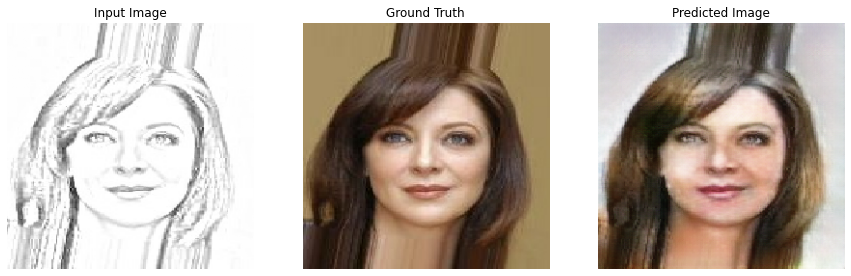

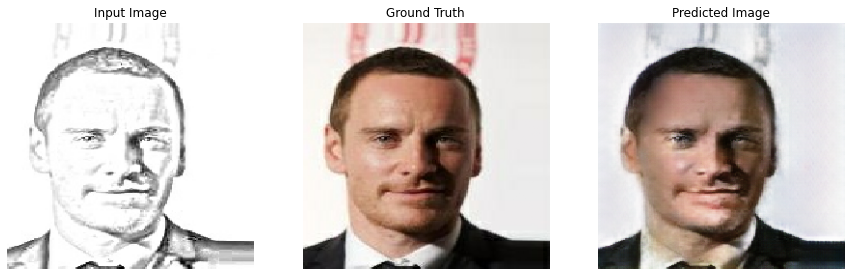

In [36]:
filepath = './results/final_model_sample_'

i = 1
for n, (inp, tar) in test_dataset.take(20).enumerate():
  generate_images(final_model['generator_g'],inp,tar)
  save_images(final_model["generator_g"], inp, tar, filepath+str(i))
  i += 1

In [40]:
final_model['generator_g'].save_weights("cyclegan_weights_unet.h5")

# TO DO
## compare performance of U-net generator vs resnet generator